<h1><br>¿Los jugadores están tristes y aislados?</br></h1>
<h2><p class="texto-justificado">El tiempo que se pasa en línea y/o jugando videojuegos ha aumentado en la vida diaria de un
gran número de personas en todo el mundo.
En consecuencia, se han expresado preocupaciones con respecto al comportamiento adictivo como equipo queremos ver a través de graficas estas distintos trastornos. 
</p></h2>

<h1><br>Los Trastornos que se veran son los siguientes:</br></h1>
<h2>GAD = Generalized Anxiety Disorder</h2>
<h2>SWL = Satisfaction with Life Scale</h2>
<h2>SPIN = Social Phobia Inventory</h2>
<h2>SINS = Single Item Narcissism Scale</h2>

¿Jugar League of Legends te hace propenso de sufrir algún transtorno? (Explicar el objetivo de la investigación)

Conformación del equipo

Colocar las fuentes de informacipión donde se obtuvo el dataset, etc.

Aplicar distribución normal

In [6]:
import numpy as np
import pandas as pd
import pandas_profiling
import tkinter

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df_gaming = pd.read_csv("./Datasets/Gaming-anxiety.csv", encoding= 'unicode_escape')
df_gaming

,Unnamed: 0,Zeitstempel,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,GADE,...,Birthplace,Residence,Reference,Playstyle,accept,GAD_T,SWL_T,SPIN_T,Residence_ISO3,Birthplace_ISO3
0,1,42052.004366,0,0,0,0,1,0,0,Not difficult at all,...,USA,USA,Reddit,Singleplayer,Accept,1,23,5.0,USA,USA
1,2,42052.006803,1,2,2,2,0,1,0,Somewhat difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,8,16,33.0,USA,USA
2,3,42052.038599,0,2,2,0,0,3,1,Not difficult at all,...,Germany,Germany,Reddit,Singleplayer,Accept,8,17,31.0,DEU,DEU
3,4,42052.068037,0,0,0,0,0,0,0,Not difficult at all,...,USA,USA,Reddit,Multiplayer - online - with online acquaintanc...,Accept,0,17,11.0,USA,USA
4,5,42052.089478,2,1,2,2,2,3,2,Very difficult,...,USA,South Korea,Reddit,Multiplayer - online - with strangers,Accept,14,14,13.0,KOR,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,14246,42057.756784,1,0,0,1,0,1,1,Not difficult at all,...,France,France,Reddit,Multiplayer - online - with strangers,Accept,4,28,7.0,FRA,FRA
13460,14247,42057.811853,3,3,3,3,2,3,3,Extremely difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,20,23,25.0,USA,USA
13461,14248,42058.169644,0,0,0,0,0,0,0,Not difficult at all,...,Norway,Norway,Reddit,Multiplayer - online - with real life friends,Accept,0,32,10.0,NOR,NOR
13462,14249,42058.244204,3,2,1,3,0,1,3,Somewhat difficult,...,Canada,Canada,Reddit,Singleplayer,Accept,13,16,32.0,CAN,CAN


<AxesSubplot:>

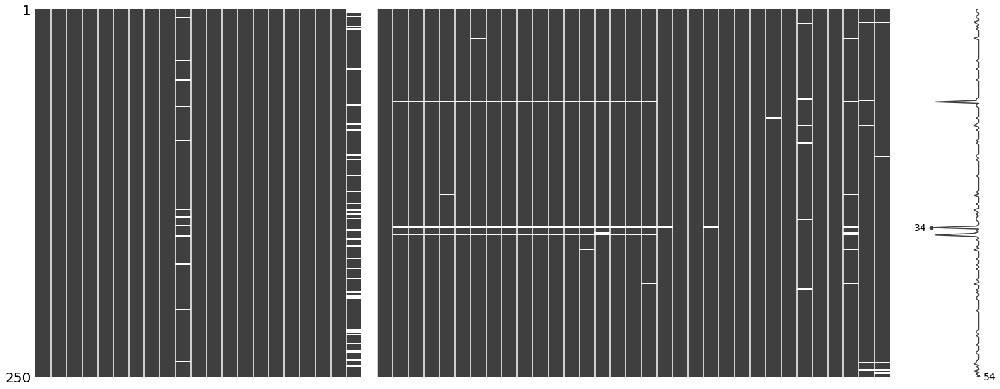

In [8]:
import missingno as dataFaltante
%matplotlib inline
dataFaltante.matrix(df_gaming.sample(250))

<h4>Vemos los datos faltantes en blanco de nuestro dataset</h4>

In [9]:
df_league_of_legends = df_gaming[df_gaming['Game'] == "League of Legends"]
df_league_of_legends = df_league_of_legends[df_gaming['Hours'] < 300]

df_league_of_legends.shape

C:\Users\Oteiz\AppData\Local\Temp/ipykernel_11980/3904755527.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_league_of_legends = df_league_of_legends[df_gaming['Hours'] < 300]


(11290, 55)

<h4>Realizamos la limpieza de datos. Filtramos los registros de la columna "Game", solo queremos los que tienen el valor de "League of Legends"</h4>

In [10]:
pandas_profiling.ProfileReport(df_league_of_legends)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h4>Ahora procedemos a sacar los feature que no nos brinda la información necesaria para la investigación</h4>

In [7]:
df_league_of_legends = df_league_of_legends.drop(columns=[
    'earnings',
    'Reference',
    'accept',
#     'GAD_T',
    'Birthplace_ISO3',
    'Residence_ISO3',
    'Timestamp',
    'Birthplace',
    'highestleague',
    'streams', # Estas son las cantidad de horas de stream que ven los sujetos de estudio.
    'S. No.',
    'Gender',
    'GAD1',          
    'GAD2',          
    'GAD3',          
    'GAD4',          
    'GAD5',          
#     'GAD6', Nos sirve     
#     'GAD7', Nos sirve          
    'GADE',          
    'SWL1',          
    'SWL2',          
    'SWL3',          
#     'SWL4', Nos sirve         
#     'SWL5', Nos sirve
    'SPIN1',         
    'SPIN2',         
    'SPIN3',         
    'SPIN4',         
    'SPIN5',         
    'SPIN6',         
    'SPIN7',         
    'SPIN8',         
    'SPIN9',         
    'SPIN10',        
    'SPIN11',        
    'SPIN12',        
    'SPIN13',        
    'SPIN14',        
    'SPIN15',        
#     'SPIN16', Nos sirve        
#     'SPIN17', Nos sirve
    
])

<h4>Procedemos a sacar todos los registros que tienen uno de los campos vacio (NaN)</h4>

In [8]:
df_league_of_legends = df_league_of_legends.dropna()
df_league_of_legends
# Podemos ver como 1808 registros fueron eliminados del DataFrame 
# (Se podría considerar rellenar esos campos con la mediana)

,GAD6,GAD7,SWL4,SWL5,Game,Platform,Hours,whyplay,League,SPIN16,SPIN17,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,0,0,5,7,League of Legends,PC,25.0,having fun,Gold,0.0,0.0,1.0,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3.0
27,1,1,3,5,League of Legends,PC,5.0,having fun,Bronze,3.0,1.0,3.0,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31.0
33,0,0,7,6,League of Legends,PC,9.0,improving,Silver 4,2.0,3.0,4.0,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39.0
35,1,0,6,3,League of Legends,PC,7.0,having fun,Gold,1.0,3.0,2.0,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29.0
48,0,2,3,2,League of Legends,PC,25.0,improving,Unranked - Low ELO,0.0,2.0,3.0,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13452,0,0,5,1,League of Legends,PC,10.0,having fun,Silver V,1.0,0.0,1.0,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23.0
13455,2,0,3,3,League of Legends,PC,30.0,winning,Gold V,1.0,0.0,2.0,18,Student at school,High school diploma (or equivalent),Austria,Singleplayer,6,17,14.0
13456,2,0,7,6,League of Legends,PC,12.0,relaxing,Gold 3,0.0,0.0,3.0,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6.0
13457,0,0,1,1,League of Legends,PC,15.0,improving,silver,0.0,3.0,1.0,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33.0


<h4>Se pasaron todos los valores decimales a valor de número entero</h4>

In [9]:
float_col = df_league_of_legends.select_dtypes(include=['float64'])
for col in float_col:
    df_league_of_legends[col] = df_league_of_legends[col].astype(int)
df_league_of_legends

,GAD6,GAD7,SWL4,SWL5,Game,Platform,Hours,whyplay,League,SPIN16,SPIN17,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,0,0,5,7,League of Legends,PC,25,having fun,Gold,0,0,1,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3
27,1,1,3,5,League of Legends,PC,5,having fun,Bronze,3,1,3,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31
33,0,0,7,6,League of Legends,PC,9,improving,Silver 4,2,3,4,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39
35,1,0,6,3,League of Legends,PC,7,having fun,Gold,1,3,2,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29
48,0,2,3,2,League of Legends,PC,25,improving,Unranked - Low ELO,0,2,3,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13452,0,0,5,1,League of Legends,PC,10,having fun,Silver V,1,0,1,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23
13455,2,0,3,3,League of Legends,PC,30,winning,Gold V,1,0,2,18,Student at school,High school diploma (or equivalent),Austria,Singleplayer,6,17,14
13456,2,0,7,6,League of Legends,PC,12,relaxing,Gold 3,0,0,3,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6
13457,0,0,1,1,League of Legends,PC,15,improving,silver,0,3,1,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33


In [10]:
df_league_of_legends.count()

GAD6          9568
GAD7          9568
SWL4          9568
SWL5          9568
Game          9568
Platform      9568
Hours         9568
whyplay       9568
League        9568
SPIN16        9568
SPIN17        9568
Narcissism    9568
Age           9568
Work          9568
Degree        9568
Residence     9568
Playstyle     9568
GAD_T         9568
SWL_T         9568
SPIN_T        9568
dtype: int64

<h4>Procedemos a ver que relación hay entre los feature escogidos.</h4>

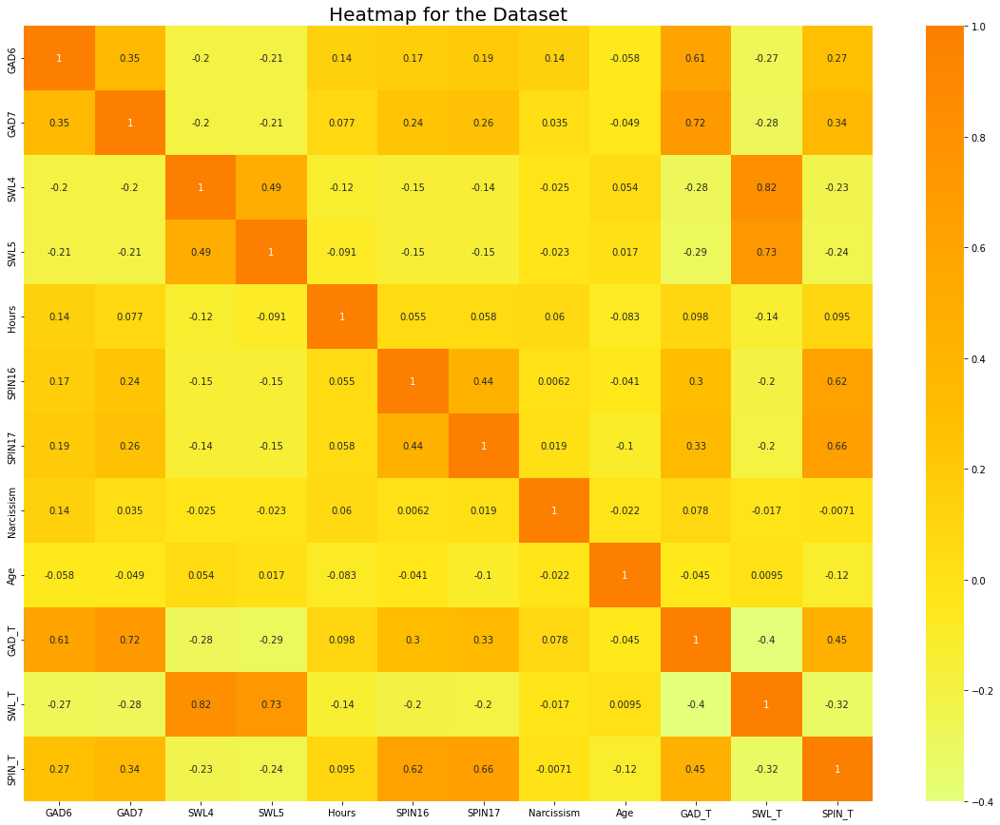

In [11]:
plt.rcParams['figure.figsize'] = (20, 15)
sns.heatmap(df_league_of_legends.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

<h4>Podemos ver como los jovenes de entre 20 a 30 años son mas propensos a jugar mas de 40 horas a la semana, en su mayoria siendo o estudiantes o desempleados.</h4>

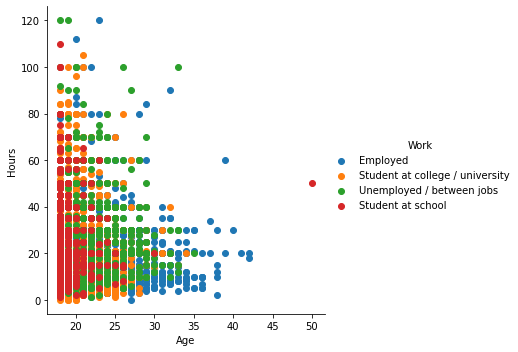

In [12]:
sns.FacetGrid(df_league_of_legends, hue = 'Work', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

In [13]:
# plt.figure(dpi = 100, figsize = (5,4))
# print("Age con W ==> \n")
# for i in  df_league_of_legends.columns:
#     if i != 'Age' and i != 'Work':
#         print(f"Correlacion entre Age y {i} ==> ", df_league_of_legends.corr().loc['Age'][i])
#         sns.jointplot(x='Age', y=i, data=df_league_of_legends, kind = 'reg', color = 'purple')
#         plt.show()

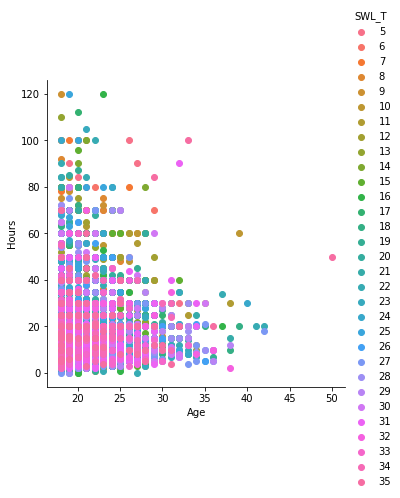

In [14]:
sns.FacetGrid(df_league_of_legends, hue = 'SWL_T', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

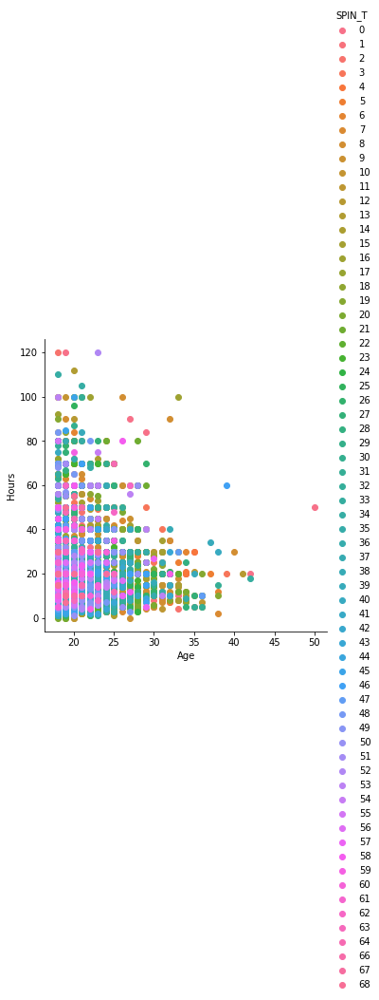

In [15]:
sns.FacetGrid(df_league_of_legends, hue = 'SPIN_T', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

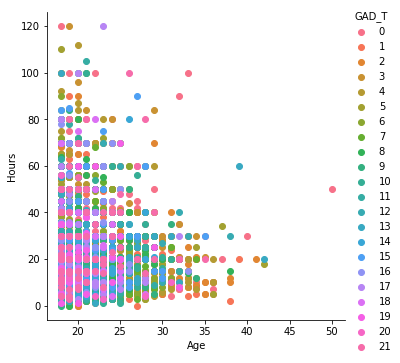

In [16]:
sns.FacetGrid(df_league_of_legends, hue = 'GAD_T', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()